# Import Necessary Library

In [1]:
!pip install pivottablejs
!pip install pandas_profiling
!pip install pygwalker

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 51.1 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.3
    Uninstalling numpy-1.24.3:
      Successfully uninstalled numpy-1.24.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
apache-beam 2.46.0 requires dill<0.3.2,>=0.3.1.1, but you have dill 0.3.7 which is incompatible.
apache-beam 2.46.0 requires pyarrow<10.0.0,>=3.0.0, but you have pyarrow 14.0.1 which is incompatible.
chex 0.1.85 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
libpysal 4.9.2 requires packaging>=22, but you have packaging 21.3 which is incompatible.
libpysal 4.9.2 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
momepy 0.7.0 requires shapely>=2, but you have shapely 1.8.5.post1 which is incompatible.
pymc3 3.11.5 requires 

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import matplotlib.pyplot as plt
import seaborn as sb
import re
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
import warnings
warnings.filterwarnings("ignore")
from nltk.corpus import stopwords
from collections import Counter, defaultdict
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import RepeatedStratifiedKFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.metrics import f1_score
import lime
from lime import lime_text
from lime.lime_text import LimeTextExplainer
from pandas_profiling import ProfileReport
import pygwalker as pyg
from pivottablejs import pivot_ui

# Data Exploration

In [3]:
train = pd.read_csv('/kaggle/input/nlp-getting-started/train.csv')

In [4]:
train_profile = ProfileReport(train, title="train")
train_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
pivot_ui(train)

In [6]:
walker = pyg.walk(train)


Box(children=(HTML(value='<div id="ifr-pyg-00060e451e408d38InvxYONeiWjF2t3T" style="height: auto">\n    <head>…

In [7]:
test = pd.read_csv('/kaggle/input/nlp-getting-started/test.csv')

In [8]:
test_profile = ProfileReport(test, title="test")
test_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
pivot_ui(test)

In [10]:
walker = pyg.walk(test)

Box(children=(HTML(value='<div id="ifr-pyg-00060e45260097a9hOA4FBKRrZlT7Sxa" style="height: auto">\n    <head>…

In [11]:
test_profile = ProfileReport(test, title="test")
test_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
sample_submission=pd.read_csv("/kaggle/input/nlp-getting-started/sample_submission.csv")

In [13]:
sample_submission_profile = ProfileReport(sample_submission, title="sample_submission")
sample_submission_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
pivot_ui(sample_submission)

In [15]:
walker = pyg.walk(sample_submission)

Box(children=(HTML(value='<div id="ifr-pyg-00060e4528cac5ecuXb3er8RkEJQ7cVB" style="height: auto">\n    <head>…

In [17]:
socialmedia_disaster_tweets = pd.read_csv("/kaggle/input/socialmedia-disaster-tweets-dfe/socialmedia-disaster-tweets-DFE.csv", encoding='latin-1')


In [18]:
socialmedia_disaster_tweets_profile = ProfileReport(socialmedia_disaster_tweets, title="socialmedia_disaster_tweets")
socialmedia_disaster_tweets_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
pivot_ui(socialmedia_disaster_tweets)


In [20]:
walker = pyg.walk(socialmedia_disaster_tweets)


Box(children=(HTML(value='<div id="ifr-pyg-00060e45314e4042qWpucUHdiCQhfT8l" style="height: auto">\n    <head>…

In [21]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7613 entries, 0 to 7612
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        7613 non-null   int64 
 1   keyword   7552 non-null   object
 2   location  5080 non-null   object
 3   text      7613 non-null   object
 4   target    7613 non-null   int64 
dtypes: int64(2), object(3)
memory usage: 297.5+ KB


#### There is a total of 7613 rows(entries) with 4 columns(features) other than id.

##### **keyword** tells about a particular keyword from text which might relate to disaster. It contains 61(0.8%) missing values.
##### **location** tells about where the tweet was sent from. It contains 2533(33.27%) missing values.
##### **text** is the tweet made.
##### **target** tells whether the tweet is real disaster(1) or not(0). It has a split of 0 with 4342(57%) and 1 with 3271(43%)

In [22]:
top = train.groupby('keyword')['id'].count()
top = pd.DataFrame({'keyword':top.index,'count':top.values}).sort_values(by=['count']).tail(20)

In [23]:
bottom = train.groupby('keyword')['id'].count()
bottom = pd.DataFrame({'keyword':bottom.index,'count':bottom.values}).sort_values(by=['count']).head(20)

221 total unique keywords/toplam benzersiz anahtar kelimeler


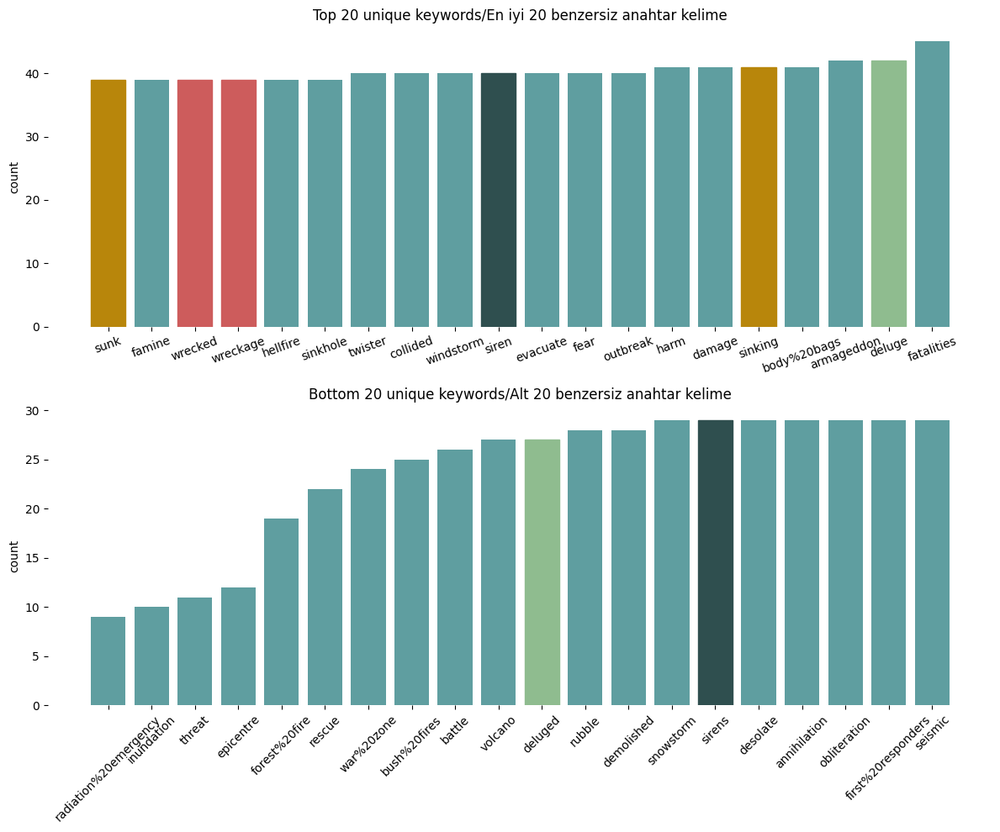

In [24]:
plt.figure(figsize=(12,10))

plt.subplot(211)
barlist = plt.bar(data=top, x = 'keyword',height = 'count',color = 'cadetblue')
plt.xticks(rotation = 20);
plt.ylabel('count')
plt.title('Top 20 unique keywords/En iyi 20 benzersiz anahtar kelime')
barlist[0].set_color('darkgoldenrod');
barlist[2].set_color('indianred');
barlist[3].set_color('indianred');
barlist[15].set_color('darkgoldenrod');
barlist[9].set_color('darkslategrey');
barlist[18].set_color('darkseagreen');

plt.subplot(212)
barlist = plt.bar(data=bottom, x = 'keyword',height = 'count', color = 'cadetblue');
plt.xticks(rotation = 45);
plt.ylabel('count');
plt.title('Bottom 20 unique keywords/Alt 20 benzersiz anahtar kelime')
barlist[14].set_color('darkslategrey');
barlist[10].set_color('darkseagreen');

sb.despine(left = True, bottom  = True)
plt.tight_layout()

print(str(train['keyword'].nunique())+ ' total unique keywords/toplam benzersiz anahtar kelimeler')

### **Observations**

##### fatalities was the highest keyword with around 42 tweets containing keyword. radiation emergency was the least with around 9 tweets containing it.
##### From the top20 we can see wrecked and wreckage as different keywords but both mean the same, just tense is different. There are other keywords also present in same format eg: dead, death, annihilation, annihilated, sunk, sinking etc.
##### same colors are given to repeated words with different tenses
##### Text handling to be done

### **Repalce missing with None**
##### lemmatize and change values with same meaninig into a single value.
##### repalce the '%20' in text with some thing else

3341 total unique locations/toplam benzersiz konumlar


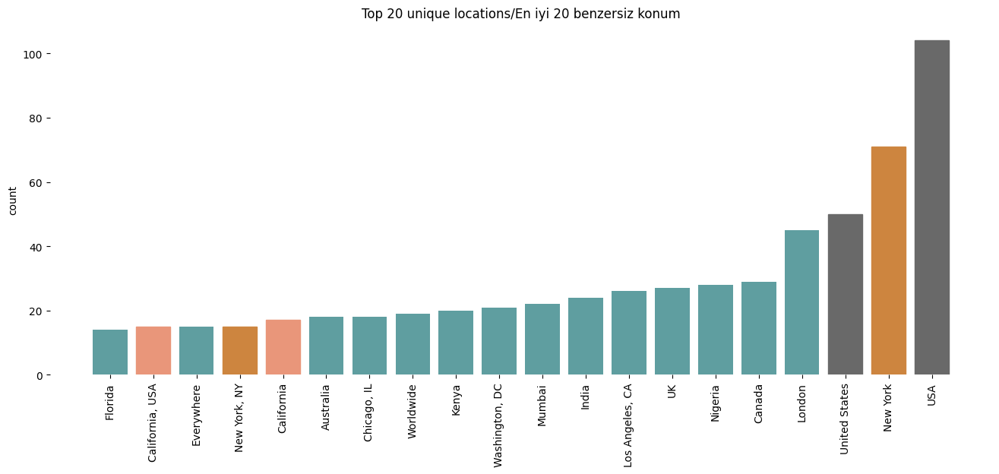

In [25]:
top = train.groupby('location')['id'].count()
top = pd.DataFrame({'location':top.index,'count':top.values}).sort_values(by=['count']).tail(20)


plt.figure(figsize=(16,6))

barlist = plt.bar(data=top, x = 'location',height = 'count', color = 'cadetblue')
plt.xticks(rotation = 90);
plt.ylabel('count')
plt.title('Top 20 unique locations/En iyi 20 benzersiz konum')

barlist[1].set_color('darksalmon')
barlist[4].set_color('darksalmon')
barlist[3].set_color('peru')
barlist[18].set_color('peru')
barlist[17].set_color('dimgrey')
barlist[19].set_color('dimgrey')

sb.despine(left = True, bottom  = True)

print(str(train['location'].nunique())+ ' total unique locations/toplam benzersiz konumlar')

#### **Observations**

##### 3341 unique values in 7631 which is 43.5% of the data.
##### Even unique there are few values which have repeated like "United States" and "USA" represent the same. "New York, NY" and "New York" both are same.
##### This column can be a country like INDIA or a city in that country Mumbai. Because the tweets can be specific to city or generic to a country.

#### **Text Handling to be done**

##### Replace NaN with None
##### change the same locations into one eg : 'New York NY', 'New York' both are same.
##### Dont not replce city to country eg: 'Mumbai' and 'INDIA' because tweet can be specifict to city or to a country.

# Clean the Code

#### From all the observations made it looks lot of cleaning is required. lets list them

* 1. Repalce missing in keyword and location column with None
* 2. In keyword column lemmatize and change values with same meaninig into a single value.
* 3. IN keyword repalce the '%20' in text with some thing else
* 4. change the same locations into one eg : 'New York, NY' and 'New York' both are same.
* 5. tags representing cities, incidents @ notations and http links to handle
* 6. Special characters like ' -, => , .,: ' are also present to handle.
* 7. Special symbols like '\x89UO' are present might be emotes need to be removed

In [26]:
def find_URL(text):
    url = re.compile(r'https?://\S+|www\.\S+')
    return (url.search(text) != None)


In [27]:
def clean_text(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons/ifadeler
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs/semboller ve piktograflar
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols/ulaşım ve harita sembolleri
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)/bayraklar (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    text = emoji_pattern.sub(r'', text)
    
    url = re.compile(r'https?://\S+|www\.\S+')
    text = url.sub(r'',text)
    
    text = text.replace('#',' ')
    text = text.replace('@',' ')
    symbols = re.compile(r'[^A-Za-z0-9 ]')
    text = symbols.sub(r'',text)
    
    return text

In [28]:
def lemma(text):
    txt1 = wordnet_lemmatizer.lemmatize(text,pos=wordnet.NOUN)
    txt2 = wordnet_lemmatizer.lemmatize(text,pos=wordnet.VERB)
    txt3 = wordnet_lemmatizer.lemmatize(text,pos=wordnet.ADJ)
    if len(txt1) <= len(txt2) and len(txt1) <= len(txt3):
        text = txt1
    elif len(txt2) <= len(txt1) and len(txt2) <= len(txt3):
        text = txt2
    else:
        text = txt3   
    
    return text


In [29]:
train['keyword'].fillna('None', inplace=True)
train['location'].fillna('None', inplace=True)

### 3. Replace %20 in the keyword column


In [30]:
train['keyword'] = train['keyword'].str.replace('%20','')

### 4. location column handling


In [31]:
for ind in range(train.shape[0]):
    train.loc[ind,'location'] = train.loc[ind,'location'].split(',')[0]

### 5,6,7. Text column handling


In [32]:
for ind in range(train.shape[0]):
    train.loc[ind,'tags_count'] = len(train.loc[ind,'text']) -  len(train.loc[ind,'text'].replace('#',''))
    train.loc[ind,'@_count'] = len(train.loc[ind,'text']) -  len(train.loc[ind,'text'].replace('@',''))
    train.loc[ind,'http_link'] =  find_URL(train.loc[ind,'text'])

In [33]:
train['text'] = train['text'].apply(lambda x: clean_text(x))

In [34]:
train.head(5)

,id,keyword,location,text,target,tags_count,@_count,http_link
0,1,None,None,Our Deeds are the Reason of this earthquake M...,1,1.0,0.0,False
1,4,None,None,Forest fire near La Ronge Sask Canada,1,0.0,0.0,False
2,5,None,None,All residents asked to shelter in place are be...,1,0.0,0.0,False
3,6,None,None,13000 people receive wildfires evacuation ord...,1,1.0,0.0,False
4,7,None,None,Just got sent this photo from Ruby Alaska as ...,1,2.0,0.0,False


In [35]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [36]:
target = pd.read_csv('/kaggle/input/nlp-getting-started/train.csv')['target']
train = pd.read_csv('/kaggle/input/nlp-getting-started/train.csv')
test = pd.read_csv('/kaggle/input/nlp-getting-started/test.csv')
ssub = pd.read_csv('/kaggle/input/nlp-getting-started/sample_submission.csv')

In [37]:
train['hashtags']=train['text'].apply(lambda x:re.findall('#\w*',x))

In [38]:
labels=['Negative','Positive']
no_clusters=2

Target:- Negative


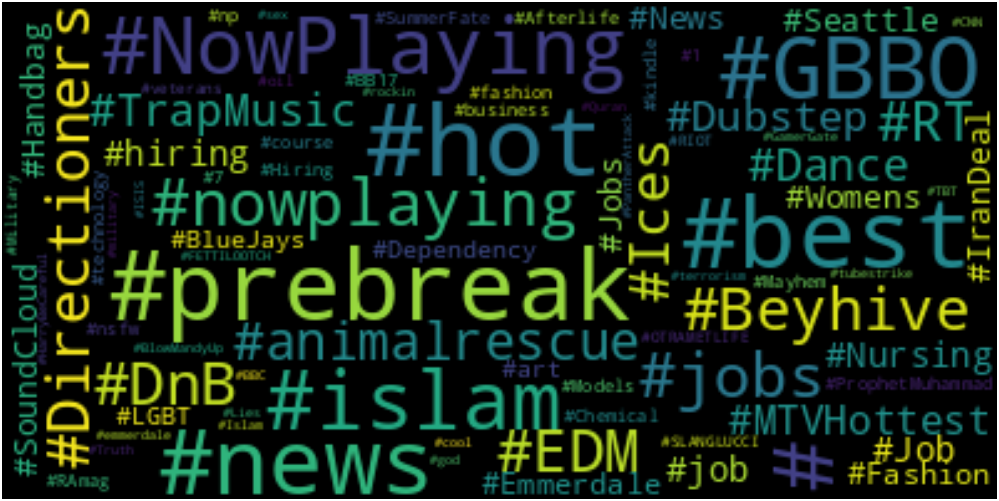

Target:- Positive


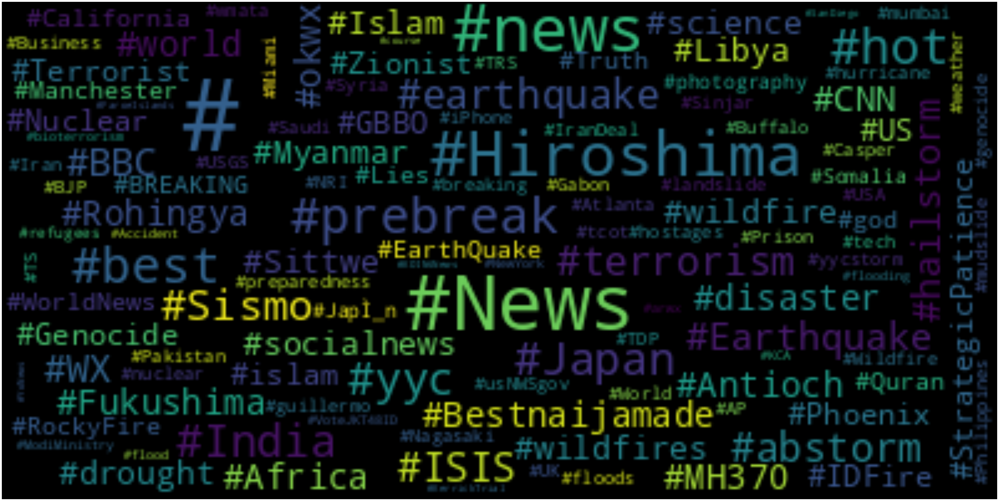

In [39]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd

# Loop through two labels/İki etiket üzerinde döngü kur
for c in range(2):
    print('Target:-',labels[c])
    hts = list(train[train['target'] == c]['hashtags'])

    # Flatten list of lists into a single list/Listelerin listesini tek bir liste haline getir
    hashes = [h.strip() for ht in hts for h in ht]

    # Join list of hashtags into a string/Hashtag listesini bir metin haline getir
    string_hash = ' '.join(hashes)

    # Count the frequency of each hashtag/Her hashtagin frekansını say
    hash_values = pd.Series(hashes).value_counts()

    # Convert frequency series to a dictionary/Frekans serisini bir sözlüğe dönüştür
    d = hash_values.to_dict()

    # Generate wordcloud from frequency dictionary/Frekans sözlüğünden kelime bulutu oluştur
    wordcloud = WordCloud(max_font_size=40)
    wordcloud.generate_from_frequencies(frequencies=d)

    # Plot wordcloud/Kelime bulutunu çiz
    plt.figure(figsize=(70, 70))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()


# Model Prediction Algorithm

In [44]:
import pandas as pd
test_df = pd.read_csv('/kaggle/input/nlp-getting-started/test.csv')
gt_df = pd.read_csv("/kaggle/input/socialmedia-disaster-tweets-dfe/socialmedia-disaster-tweets-DFE.csv", encoding='latin-1')


In [45]:
# select columns 'choose_one' and 'text' / 'choose_one' ve 'text' sütunlarını seç
gt_df = gt_df[['choose_one', 'text']]

# Assign 1 to target column of rows marked 'Relevant' and 0 to others / Relevant' olarak işaretlenen satırların hedef sütununa 1, diğerlerine 0 ata
gt_df['target'] = (gt_df['choose_one'] == 'Relevant').astype(int)

# Add an id to each line / Her satıra bir id ekle
gt_df['id'] = gt_df.index
gt_df

,choose_one,text,target,id
0,Relevant,Just happened a terrible car crash,1,0
1,Relevant,Our Deeds are the Reason of this #earthquake M...,1,1
2,Relevant,"Heard about #earthquake is different cities, s...",1,2
3,Relevant,"there is a forest fire at spot pond, geese are...",1,3
4,Relevant,Forest fire near La Ronge Sask. Canada,1,4
...,...,...,...,...
10871,Relevant,M1.94 [01:04 UTC]?5km S of Volcano Hawaii. htt...,1,10871
10872,Relevant,Police investigating after an e-bike collided ...,1,10872
10873,Relevant,The Latest: More Homes Razed by Northern Calif...,1,10873
10874,Relevant,MEG issues Hazardous Weather Outlook (HWO) htt...,1,10874


### This code performs operations on a DataFrame and selects the choose_one and text columns from the dataset. It assigns a value of 1 to the target column for rows in the choose_one column with the value "Relevant", and 0 to all other rows. It also adds an id to each row. These operations create a new DataFrame.

In [46]:
merged_df = pd.merge(test_df, gt_df, on='id')
merged_df

,id,keyword,location,text_x,choose_one,text_y,target
0,0,NaN,NaN,Just happened a terrible car crash,Relevant,Just happened a terrible car crash,1
1,2,NaN,NaN,"Heard about #earthquake is different cities, s...",Relevant,"Heard about #earthquake is different cities, s...",1
2,3,NaN,NaN,"there is a forest fire at spot pond, geese are...",Relevant,"there is a forest fire at spot pond, geese are...",1
3,9,NaN,NaN,Apocalypse lighting. #Spokane #wildfires,Relevant,Apocalypse lighting. #Spokane #wildfires,1
4,11,NaN,NaN,Typhoon Soudelor kills 28 in China and Taiwan,Relevant,Typhoon Soudelor kills 28 in China and Taiwan,1
...,...,...,...,...,...,...,...
3258,10861,NaN,NaN,EARTHQUAKE SAFETY LOS ANGELES ÛÒ SAFETY FASTE...,Not Relevant,EARTHQUAKE SAFETY LOS ANGELES ÛÒ SAFETY FASTE...,0
3259,10865,NaN,NaN,Storm in RI worse than last hurricane. My city...,Relevant,Storm in RI worse than last hurricane. My city...,1
3260,10868,NaN,NaN,Green Line derailment in Chicago http://t.co/U...,Relevant,Green Line derailment in Chicago http://t.co/U...,1
3261,10874,NaN,NaN,MEG issues Hazardous Weather Outlook (HWO) htt...,Relevant,MEG issues Hazardous Weather Outlook (HWO) htt...,1


In [47]:
subm_df = merged_df[['id', 'target']]
subm_df

,id,target
0,0,1
1,2,1
2,3,1
3,9,1
4,11,1
...,...,...
3258,10861,0
3259,10865,1
3260,10868,1
3261,10874,1


In [48]:
subm_df.to_csv('submission_serkan.csv', index=False) 